In [ ]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Automatically generating object masks with SAM

Since SAM can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image. This method was used to generate the dataset SA-1B.

The class `SamAutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [ ]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

## Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [3]:
using_colab = True

In [4]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.6.0+cu124
Torchvision version: 0.21.0+cu124
CUDA is available: True
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-v8zqluw8
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-v8zqluw8
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=b4c772a2bd52a2685f9c4e8673e8fb3d0e9fcc41bf53f71388b7e2caf13b8933
  Stored in directory: /tmp/pip-ephem-wheel-cache-iido954l/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything
--2025-05-12 04:59:28--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com

## Set-up

In [5]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [6]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

## Example image

In [7]:
image = cv2.imread('1747025836644.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

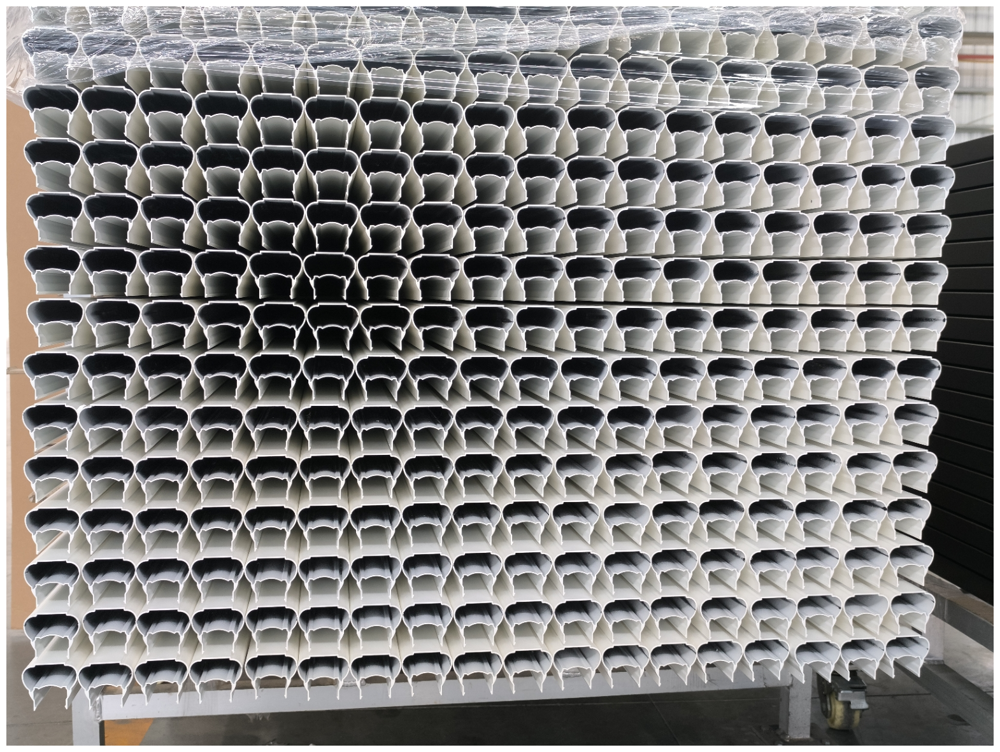

In [8]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

## Automatic mask generation

To run automatic mask generation, provide a SAM model to the `SamAutomaticMaskGenerator` class. Set the path below to the SAM checkpoint. Running on CUDA and with the default model is recommended.

In [9]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

To generate masks, just run `generate` on an image.

In [ ]:
masks = mask_generator.generate(image)

Mask generation returns a list over masks, where each mask is a dictionary containing various data about the mask. These keys are:
* `segmentation` : the mask
* `area` : the area of the mask in pixels
* `bbox` : the boundary box of the mask in XYWH format
* `predicted_iou` : the model's own prediction for the quality of the mask
* `point_coords` : the sampled input point that generated this mask
* `stability_score` : an additional measure of mask quality
* `crop_box` : the crop of the image used to generate this mask in XYWH format

In [ ]:
print(len(masks))
print(masks[0].keys())

dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


Show all the masks overlayed on the image.

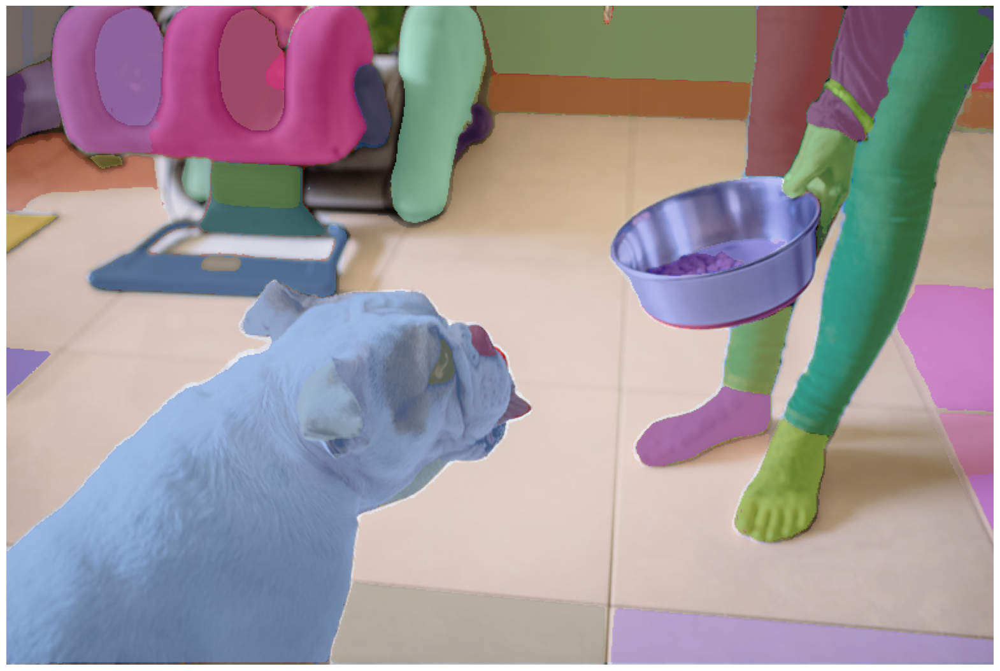

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [11]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=42,
    pred_iou_thresh=0.5,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=0,  # Requires open-cv to run post-processing
    #box_nms_thresh=0.5,
)

In [12]:
masks2 = mask_generator_2.generate(image)

In [ ]:
len(masks2)

90

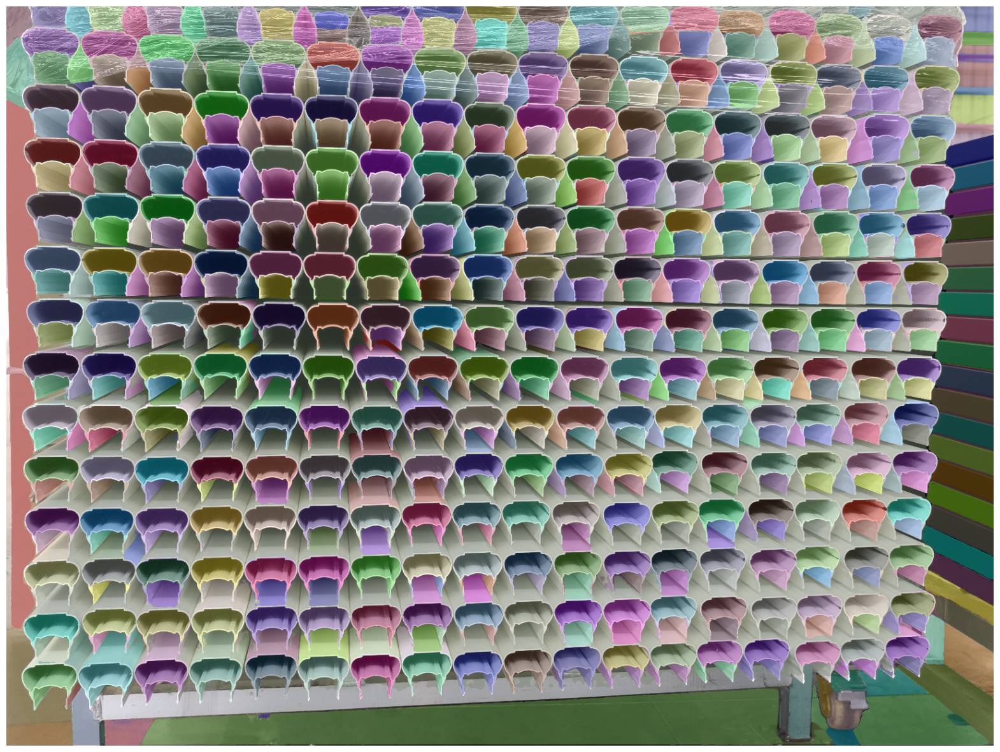

In [13]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show()

In [14]:
sorted_masks = sorted(
    masks2,
    key=lambda x: (x['point_coords'][0][1], x['point_coords'][0][0])
)

In [15]:
def find_largest_mask(masks):
    max_area = -1
    largest_mask = None
    largest_index = -1

    for i, mask in enumerate(masks):
        mask_arr = np.array(mask, dtype=bool)
        area = np.sum(mask_arr)
        if area > max_area:
            max_area = area
            largest_mask = mask_arr
            largest_index = i

    return largest_index, largest_mask, max_area

In [16]:
masks = []
for mask in masks2:
    masks.append(mask['segmentation'])

largest_index, largest_mask, max_area = find_largest_mask(masks)

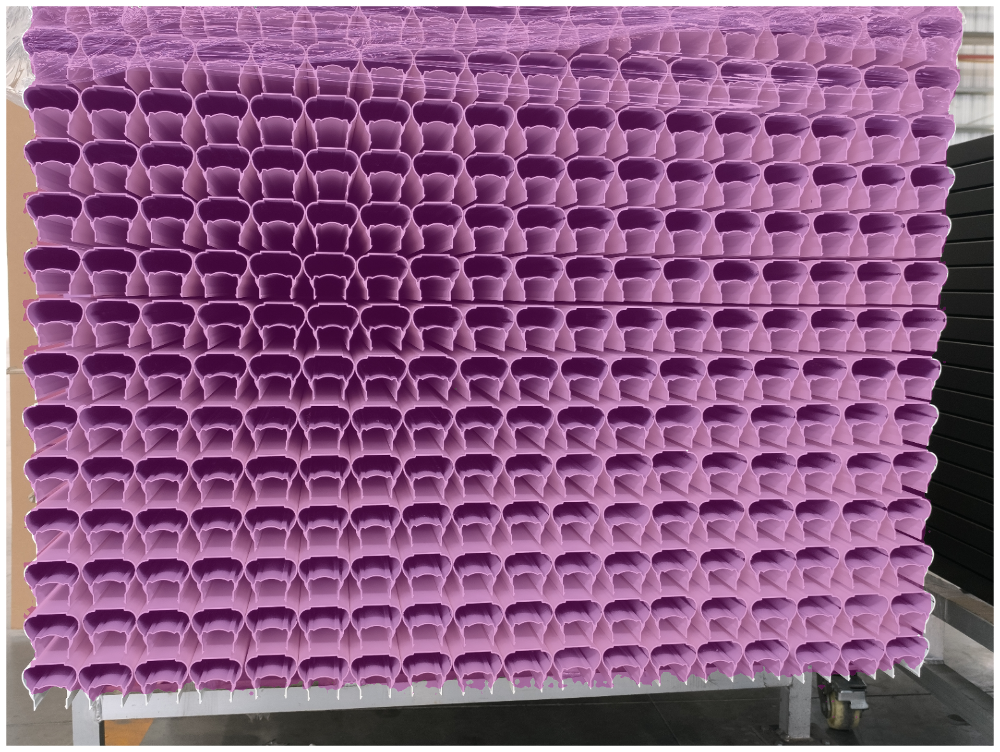

In [17]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns([masks2[largest_index]])
plt.axis('off')
plt.show()

In [18]:
def find_masks_inside(mask_A, selected_masks, overlap_threshold=0.8):
    mask_A = np.array(mask_A, dtype=bool)
    inside_indices = []

    for i, mask in enumerate(selected_masks):
        mask_arr = np.array(mask, dtype=bool)

        overlap = mask_arr & mask_A
        overlap_area = np.sum(overlap)
        mask_area = np.sum(mask_arr)

        if mask_area == 0:
            continue  # Skip empty masks

        overlap_ratio = overlap_area / mask_area

        if overlap_ratio >= overlap_threshold:
            inside_indices.append(i)

    return inside_indices

In [19]:
# Option 2: select mask from masks2
mask_A = masks2[largest_index]['segmentation']
mask_list = []
for mask in masks2:
    mask_list.append(mask['segmentation'])

inside_indices = find_masks_inside(mask_A, mask_list)

#selected_masks_new = [selected_masks[i] for i in inside_indices]

if largest_index in inside_indices:
  print("yes")
  inside_indices.remove(largest_index)
selected_masks_new = [masks2[i] for i in inside_indices]

yes


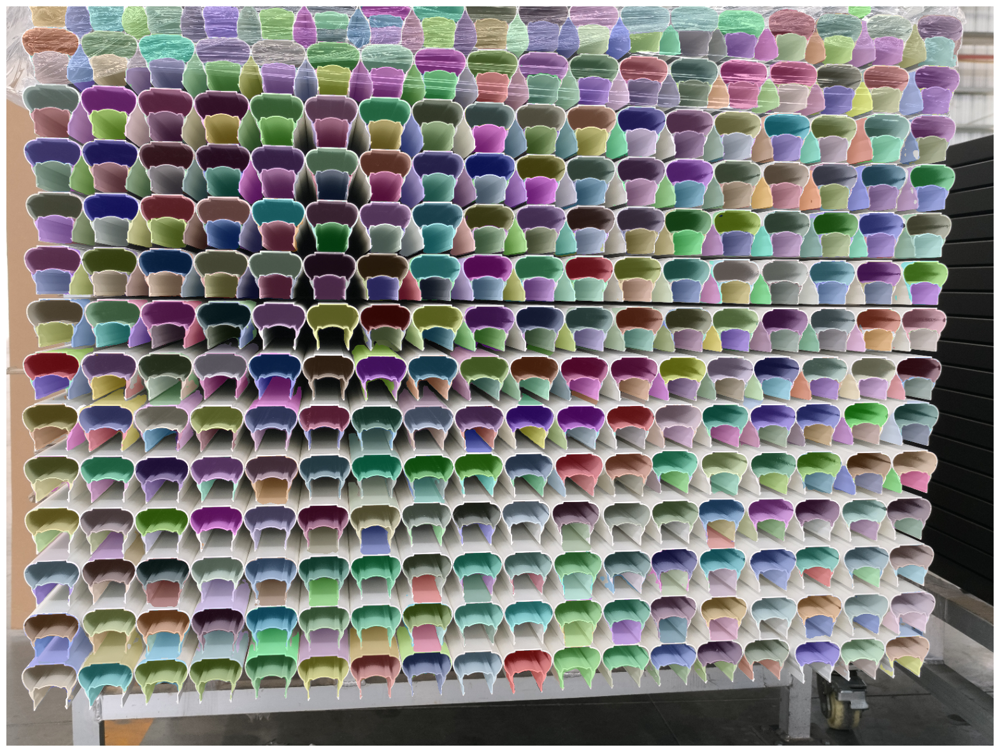

In [21]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(selected_masks_new)
plt.axis('off')
plt.show()

In [22]:
def get_bbox(mask):
    mask = np.array(mask)
    if mask.ndim != 2:
        return None
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    if not np.any(rows) or not np.any(cols):
        return None
    y_min, y_max = np.where(rows)[0][[0, -1]]
    x_min, x_max = np.where(cols)[0][[0, -1]]
    return x_min, y_min, x_max, y_max

def find_all_similar_size_groups(masks, size_tol=0.25, min_group_size=2):
    sizes = []
    indices = []

    for i, mask in enumerate(masks):
        bbox = get_bbox(mask)
        if bbox is None:
            continue
        width = bbox[2] - bbox[0]
        height = bbox[3] - bbox[1]
        sizes.append((width, height))
        indices.append(i)

    if not sizes:
        return []

    used = set()
    groups = []

    for i, (w_ref, h_ref) in enumerate(sizes):
        if indices[i] in used:
            continue
        group = [indices[i]]
        for j, (w, h) in enumerate(sizes):
            if i == j or indices[j] in used:
                continue
            w_diff = abs(w - w_ref) / max(w_ref, 1)
            h_diff = abs(h - h_ref) / max(h_ref, 1)
            if w_diff <= size_tol and h_diff <= size_tol:
                group.append(indices[j])
        if len(group) >= min_group_size:
            groups.append(sorted(group))
            used.update(group)

    # 🔽 Sort groups by size (largest group first)
    groups.sort(key=len, reverse=True)

    return groups

In [23]:
seg_mask = []
for mask in masks2:
    seg_mask.append(mask['segmentation'])

similar_size_indices = find_all_similar_size_groups(seg_mask, size_tol=0.5)

In [24]:
selected_masks = [masks2[i] for i in similar_size_indices[0]]
candidate_masks = []
for i in range(len(masks2)):
    if i not in similar_size_indices[0]:
      candidate_masks.append(masks2[i])

In [25]:
# Option 1: select mask from selected_masks
mask_A = masks2[largest_index]['segmentation']
mask_list = []
for mask in selected_masks:
#for mask in masks2:
    mask_list.append(mask['segmentation'])

inside_indices = find_masks_inside(mask_A, mask_list)

#selected_masks_new = [selected_masks[i] for i in inside_indices]

if largest_index in inside_indices:
  print("yes")
  inside_indices.remove(largest_index)
#selected_masks_new = [masks2[i] for i in inside_indices]
selected_masks_new = [selected_masks[i] for i in inside_indices]

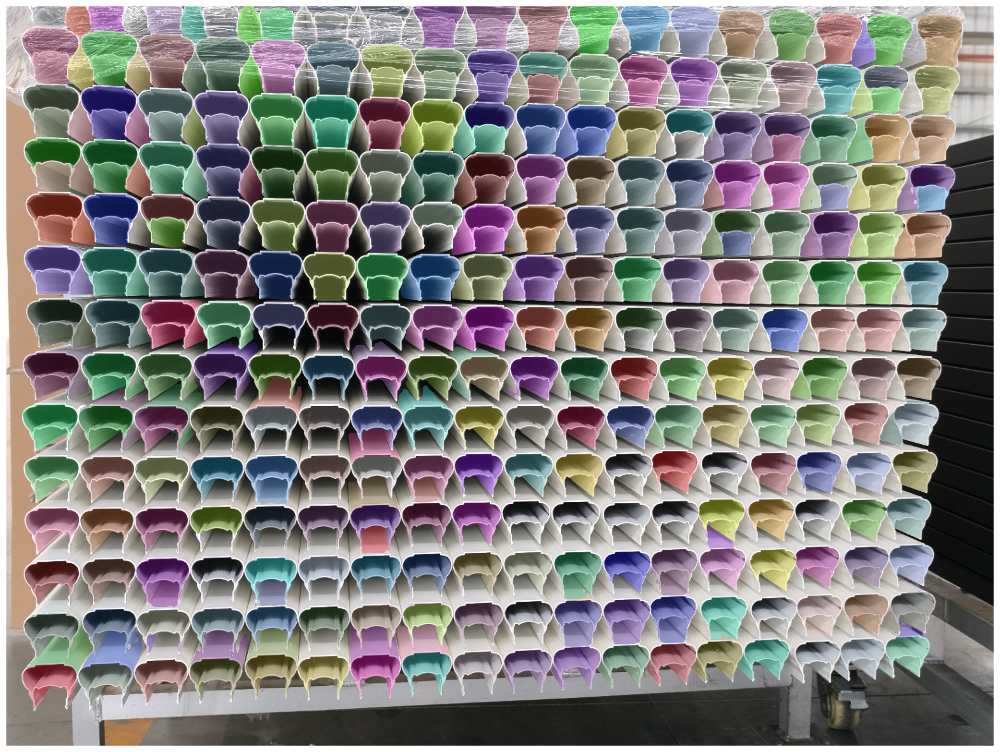

In [26]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(selected_masks_new)
plt.axis('off')
plt.show()